# 1.Making a sport classifier using Pytorch

In this notebook I'm making a sport classifier using sports image dataset, which contains 100 classes.
I'll be using a pre-trained model with transfer learning to train the model. All layers will be fine tuned and the last fully connected layer will be replaced entirely.

Dataset (100 classes):

Train folder: 13572 images, avg: 135.72 images per class.

Test folder: 500 images, avg: 5.0 images per class.

## 1.1 mount google drive to colab

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## 1.2 Copy file from google drive to colab

In [ ]:
# copy dataset from google drive to colab.
!cp ./drive/MyDrive/Project_LO/Project_DL_CNN_100Sports/Sports.zip ./

## 1.3 Extract dataset files

In [ ]:
%%time
# unzip dataset in colab
!mkdir ./Sports
!unzip -q Sports.zip -d ./Sports

CPU times: user 47.6 ms, sys: 11.7 ms, total: 59.2 ms
Wall time: 6.04 s


# 2.Build model

## 2.1 Load packages



In [ ]:
import matplotlib.pyplot as plt
import numpy as np

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.models as models
import torchvision.transforms as transforms

import time
import os
import tqdm
import PIL.Image as Image
from IPython.display import display

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)
print(torch.cuda.get_device_name(device))

cuda:0
Tesla T4


## 2.2 Load the data and transform

First, lets create some transforms/augmentations for our data and load the train/test data+labels from the folders.

Here we are using 224x224 images with random horizontal flip, random rotation and normalization.

In [ ]:
dataset_dir = "Sports/"

width, height = 224, 224
train_tfms = transforms.Compose([transforms.Resize((width, height)),
                                 transforms.RandomHorizontalFlip(),
                                 transforms.RandomRotation(15),
                                 transforms.ToTensor(),
                                 transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])  # mean and std from imagenet dataset                  
test_tfms = transforms.Compose([transforms.Resize((width, height)),
                                transforms.ToTensor(),
                                transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])

# create datasets
dataset = torchvision.datasets.ImageFolder(root=dataset_dir + "train", transform = train_tfms)
trainloader = torch.utils.data.DataLoader(dataset, batch_size=32, shuffle=True, num_workers=2)

dataset2 = torchvision.datasets.ImageFolder(root=dataset_dir+"test", transform = test_tfms)
testloader = torch.utils.data.DataLoader(dataset2, batch_size=32, shuffle=False, num_workers=2)

## 2.3 Model training function


In [ ]:
def train_model(model, criterion, optimizer, scheduler, n_epochs=5):
    
    losses = []
    accuracies = []
    test_accuracies = []

    # set the model to train mode initially
    model.train()
    for epoch in tqdm.tqdm(range(n_epochs)):
        since = time.time()
        running_loss = 0.0
        running_correct = 0.0
        for data in trainloader:

            # get the inputs and assign them to cuda
            inputs, labels = data
            inputs = inputs.to(device)
            labels = labels.to(device)
            optimizer.zero_grad()
            
            # forward + backward + optimize
            outputs = model(inputs)
            _, predicted = torch.max(outputs.data, 1) # .data: will be a Tensor that shares the same data with outputs, but has requires_grad=False
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            # calculate the loss/acc later
            running_loss += loss.item()
            running_correct += (labels==predicted).sum().item()

        epoch_duration = time.time() - since
        epoch_loss = running_loss / len(trainloader)
        epoch_acc = 100 / 32 * running_correct / len(trainloader)
        print("Epoch %s, duration: %d s, loss: %.4f, acc: %.4f" % (epoch+1, epoch_duration, epoch_loss, epoch_acc))
        
        losses.append(epoch_loss)
        accuracies.append(epoch_acc)
        
        # switch the model to eval mode to evaluate on test data
        model.eval()
        test_acc = eval_model(model)
        test_accuracies.append(test_acc)
        
        # re-set the model to train mode after validating
        model.train()
        scheduler.step(test_acc) # decrease learning rate
    print('Finished Training')
    return model, losses, accuracies, test_accuracies

## 2.4 Evaluate on training data
This function is called out after each epoch of training on the training data. We then measure the accuracy of the model.

In [ ]:
def eval_model(model):
    correct = 0.0
    total = 0.0
    with torch.no_grad():
        for data in testloader:
            images, labels = data
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            _, predicted = torch.max(outputs.data, 1)

            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    test_acc = correct / total
    print('Accuracy of the network on the test images: {:.4%}'.format(test_acc))
    return test_acc

# 3.Experiment

## 3.1 define parameters

In [ ]:
NUM_CLASSES = 100
model_ft = models.resnet34(pretrained=True)  

num_ftrs = model_ft.fc.in_features   # read the input of the last layer
model_ft.fc = nn.Linear(num_ftrs, NUM_CLASSES)  # replace the last layer with linear layer

model_ft = model_ft.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model_ft.parameters(), lr=0.01, momentum=0.9)

# lrscheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', patience=3, threshold = 0.9)
lrscheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', patience=2, threshold = 0.9)

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth


  0%|          | 0.00/83.3M [00:00<?, ?B/s]

## 3.2 model training

In [ ]:
model_ft, training_losses, training_accs, test_accs = train_model(model_ft, criterion, optimizer, lrscheduler, n_epochs=10)

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch 1, duration: 69 s, loss: 0.0362, acc: 99.0147


 10%|█         | 1/10 [01:11<10:40, 71.13s/it]

Accuracy of the network on the test images: 97.0000%
Epoch 2, duration: 68 s, loss: 0.0374, acc: 98.9265


 20%|██        | 2/10 [02:21<09:24, 70.58s/it]

Accuracy of the network on the test images: 97.0000%
Epoch 3, duration: 69 s, loss: 0.0334, acc: 99.1985


 30%|███       | 3/10 [03:32<08:15, 70.79s/it]

Accuracy of the network on the test images: 96.8000%
Epoch 4, duration: 69 s, loss: 0.0405, acc: 99.0147


 40%|████      | 4/10 [04:43<07:04, 70.82s/it]

Accuracy of the network on the test images: 97.2000%
Epoch 5, duration: 68 s, loss: 0.0384, acc: 98.9485


 50%|█████     | 5/10 [05:53<05:53, 70.65s/it]

Accuracy of the network on the test images: 97.2000%
Epoch 6, duration: 69 s, loss: 0.0375, acc: 98.9926


 60%|██████    | 6/10 [07:04<04:42, 70.68s/it]

Accuracy of the network on the test images: 97.0000%
Epoch 7, duration: 68 s, loss: 0.0347, acc: 99.0809


 70%|███████   | 7/10 [08:14<03:31, 70.52s/it]

Accuracy of the network on the test images: 97.4000%
Epoch 8, duration: 68 s, loss: 0.0375, acc: 99.0294


 80%|████████  | 8/10 [09:24<02:20, 70.38s/it]

Accuracy of the network on the test images: 97.4000%
Epoch 9, duration: 69 s, loss: 0.0374, acc: 98.9338


 90%|█████████ | 9/10 [10:35<01:10, 70.45s/it]

Accuracy of the network on the test images: 97.0000%
Epoch 10, duration: 68 s, loss: 0.0369, acc: 98.8971


100%|██████████| 10/10 [11:45<00:00, 70.55s/it]

Accuracy of the network on the test images: 97.4000%
Finished Training


## 3.3 As we can see the model reached 90% training accuracy by epoch 4.


Text(0.5, 1.0, 'Test Accuracy')

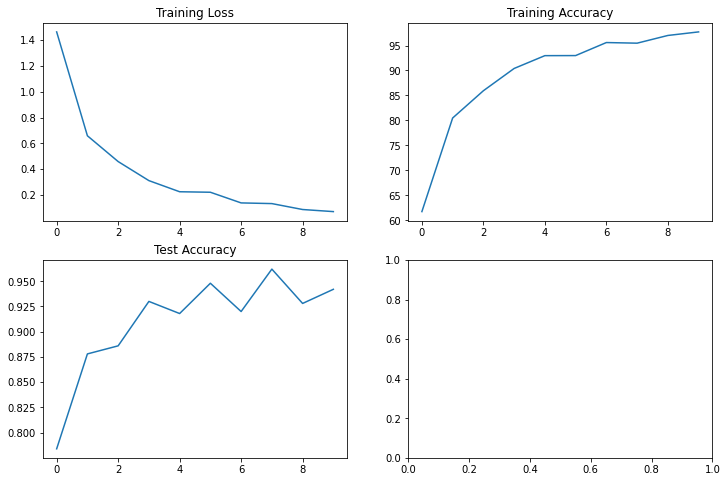

In [ ]:
# plot the stats
f, axarr = plt.subplots(2,2, figsize = (12, 8))
axarr[0, 0].plot(training_losses)
axarr[0, 0].set_title("Training Loss")
axarr[0, 1].plot(training_accs)
axarr[0, 1].set_title("Training Accuracy")
axarr[1, 0].plot(test_accs)
axarr[1, 0].set_title("Test Accuracy")

## 3.4 Evaluate the model on single image (e.g for production)



In [ ]:
# tie the class indices to their names
def find_classes(dir):
    classes = os.listdir(dir)
    classes.sort()
    class_to_idx = {classes[i]: i for i in range(len(classes))}
    return classes, class_to_idx
classes, c_to_idx = find_classes(dataset_dir+"train")

In [ ]:
# test the model on random images
# switch the model to evaluation mode to make dropout and batch norm work in eval mode
model_ft.eval()

# transforms for the input image
loader = transforms.Compose([transforms.Resize((224, 224)),
                             transforms.ToTensor(),
                             transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])
pic_path = "/content/drive/MyDrive/Project_LO/Project_DL_CNN_100Sports/high_jump.jpeg"
image = Image.open(pic_path)
image = loader(image).float()
image = torch.autograd.Variable(image, requires_grad=True)
image = image.unsqueeze(0)
image = image.cuda()
output = model_ft(image)
conf, predicted = torch.max(output.data, 1)

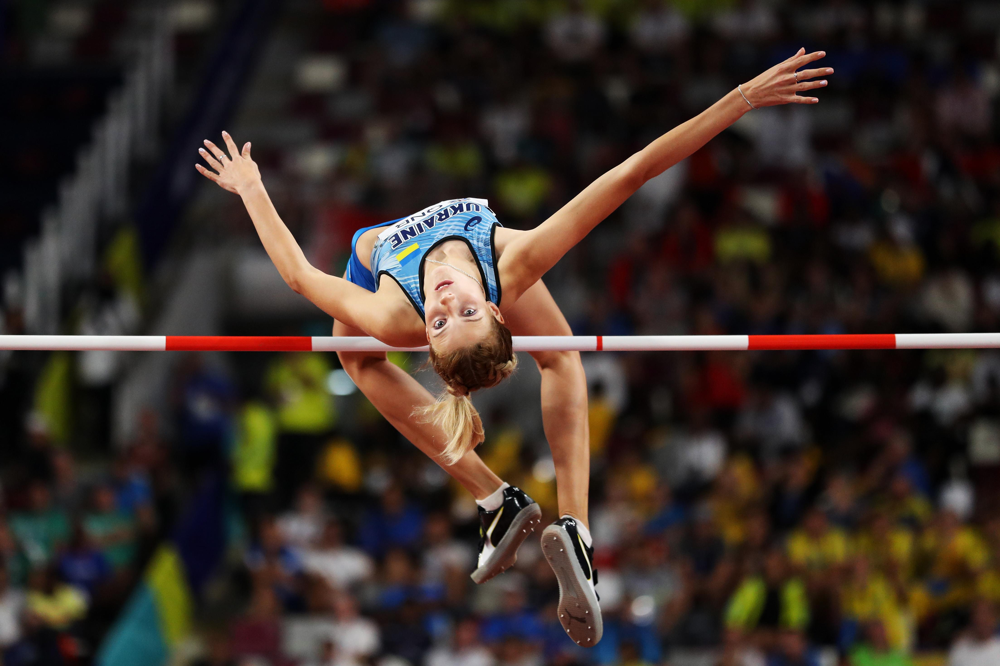

high jump confidence: 18.76759910583496


In [ ]:
# get the class name of the prediction
display(Image.open(pic_path))
print(classes[predicted.item()], "confidence:", conf.item())

# 5.Save and load model

In [ ]:
PATH = 'sports_model.pth'
torch.save(model_ft.state_dict(), PATH)

In [ ]:
model_loaded = torch.load(PATH)
model_loaded

python server api